# Compare methods with optimize parameters in ref_case

In [1]:
import xarray as xr
import pandas as pd
import numpy as np

import hvplot.xarray
import hvplot.pandas

import matplotlib.pyplot as plt
from cycler import cycler

from sstats import signals as sg
from sstats import sigp as sigp
from sstats import tseries as ts
from sstats import get_cmap_colors

import hvplot.xarray
import hvplot.pandas
import holoviews as hv

import pynsitu as pyn
import lib as lib
from lib import KEYS, raw_dir, images_dir
import os
from glob import glob

import synthetic_traj as st

from synthetic_traj import (
    synthetic_traj,
    noise_irregular_sampling,
    random_time_begin,
    ref_case,
    typical_case,
)

/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:55: UserWarning: ipyleaflet not available
  warnings.warn("ipyleaflet not available")
/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:56: UserWarning: Some functions will throw an exception if called
  warnings.warn("Some functions will throw an exception if called")


In [2]:
def ms_diff(DF, true_key, var=["x", "y", "u", "v", "ax", "ay", "X", "U", "Axy"]):
    DF = DF.copy()
    dft = DF[true_key]
    dft_ = (dft.set_index("id")[var]).groupby("id").var()
    dfms = pd.DataFrame(index=DF.keys(), columns=var)
    dfmsr = pd.DataFrame(index=DF.keys(), columns=var)
    for l in DF:
        df = DF[l]
        if np.all(df.index.values == dft.index.values):
            df_ = df.set_index("id")[var] - dft.set_index("id")[var]
            # dfr_ = (df.set_index('id')[var]-dft.set_index('id')[var])/dft.set_index('id')[var]
            dfms.loc[l] = df_.groupby("id").var().mean()
            dfmsr.loc[l] = (df_.groupby("id").var() / dft_).mean()
        else:
            print(l + " has not the same time index")
            continue
    dfms = pd.concat(
        [dfms, dfmsr.rename(columns={v: "ratio_" + v for v in var})], axis=1
    ).dropna()
    return dfms

___________
# Reference case + centered_diff

In [5]:
N = 20
acc_cut = 1e-3
position_noise = 20
ntype = "white_noise"
offset_type = "svp_scripps_10"
dt_smooth = "33min"
true_key = "True_" + dt_smooth
spectral_diff = False
ref_case["spectral_diff"] = spectral_diff
print(ref_case)

dt_rd_begin = 10

{'T': 5, 'U_low': 0.3, 'U_ni': 0.2, 'U_2': 0, 'U_1': 0, 'tau_eta': 0.1, 'n_layers': 5, 'spectral_diff': False}


In [6]:
DF = dict()

# TRUE
t = (
    50,
    "1min",
)  # use it instead of (50, 1/24/60 because otherwise not regularly sampled
dst = synthetic_traj(t, N, **ref_case)  # u,v, ax, ay computed
dft = st.dataset2dataframe(dst).rename(columns={"draw": "id"})
DF["True_1min"] = dft

# OBSERVED
dso = noise_irregular_sampling(
    dst, t, position_noise, ntype=ntype, offset_type=offset_type, istart=6097
)
dso_ = dso
#dso_['time']= dso['time']+pd.Timedelta('5min')
#dso_ = random_time_begin(dso, dt=dt_rd_begin)#add random begining
dfo = st.dataset2dataframe(dso_).rename(columns={"draw": "id"})
dfo = dfo.groupby("id").apply(pyn.geo.compute_dt, time="index")


DF["Observed"] = dfo

# SMOOTHED

t_target = pd.date_range(dfo.index.min()+pd.Timedelta('7min'), dfo.index.max(), freq=dt_smooth)

parameters_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=4e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("ax", "ay", "Axy"),
)
parameters_lowess = dict(degree=2, iteration=3, T_low_pass = 1, cutoff_low_pass = 13)
parameters_spydell = dict(nb_pt_mean=5, acc_cut=1)


dfl = pyn.drifters.smooth_all(
    dfo,
    "lowess",
    t_target,
    parameters=parameters_lowess,
    spectral_diff=spectral_diff,
    geo=False,
)
dfv = pyn.drifters.smooth_all(
    dfo,
    "variational",
    t_target,
    parameters=parameters_var,
    spectral_diff=spectral_diff,
    geo=False,
)
dfs = pyn.drifters.smooth_all(
    dfo,
    "spydell",
    t_target,
    parameters=parameters_spydell,
    spectral_diff=spectral_diff,
    geo=False,
)

DF["LOWESS"] = dfl
DF["Variational"] = dfv
DF["Empirical"] = dfs
color = {
    "True_1min": "grey",
    "Observed": "gold",
    f"True_{dt_smooth}": "k",
    "LOWESS": "teal",
    "Variational": "salmon",
    "Empirical": "r",
}

# INTERPOLATED TRUE
dsti = dst.sel(time=dfl.index.unique().sort_values())
dsti["dt"] = dsti.time.diff("time") / pd.Timedelta("1s")
st.add_position_noise(
    dsti, dsti.time, position_noise, ntype=ntype, inplace=True
)  # adding noise
dsti["u_noise"] = dsti.x_noise.differentiate("time", datetime_unit="s")
dsti["v_noise"] = dsti.y_noise.differentiate("time", datetime_unit="s")
dsti = dsti.bfill('time').ffill('time')
dfti = st.dataset2dataframe(dsti).rename(columns={"draw": "id"})
dfti = dfti.groupby("id").apply(
    pyn.geo.compute_velocities,
    time="index",
    distance="xy",
    names=("u", "v", "U"),
    centered=True,
    keep_dt=True,
    fill_startend=True,
)
dfti = dfti.groupby("id").apply(
    pyn.geo.compute_accelerations,
    from_=("xy", "x", "y"),
    names=("ax", "ay", "Axy"),
    keep_dt=True,
    fill_startend=True,
)
dfti = dfti.groupby("id").apply(
    pyn.geo.compute_accelerations,
    from_=("xy", "x_noise", "y_noise"),
    names=("ax_noise", "ay_noise", "Axy_noise"),
    keep_dt=True,
    fill_startend=True,
)
dsti = dfti.reset_index().set_index(["time", "id"]).to_xarray()

DF["True_" + dt_smooth] = dfti

centred diff
centred diff
44624.67512128158
6097
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS : 13cpd with 1pad
Divided into 1 segments
LOW-PASS 

___________
# HVPLOT

In [7]:
def hvplot_DF(DF, d, var=None):
    if not var:
        var = ["x", "y", "u", "v", "ax", "ay"]
    Hv = []
    for v in var:
        init = 0
        for l in DF:
            df = DF[l]
            if init == 0:
                hvplot = df[df.id == d][v].hvplot(
                    label=l, kind="scatter", color=color[l]
                )
                init = 1
            hvplot *= df[df.id == d][v].hvplot(label=l, kind="scatter", color=color[l])
        Hv.append(hvplot)
    print(len(Hv))
    layout = hv.Layout(Hv[0] + Hv[1] + Hv[2] + Hv[3] + Hv[4] + Hv[5]).cols(2)
    return layout

In [8]:
d = 0
DF0 = DF.copy()
DF0.pop("True_1min")
hvplot_DF(DF0, d, ["x", "y", "u", "v", "ax", "ay"])

6


:Layout
   .Overlay.I   :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (x)
      .Scatter.Observed.II :Scatter   [time]   (x)
      .Scatter.LOWESS      :Scatter   [time]   (x)
      .Scatter.Variational :Scatter   [time]   (x)
      .Scatter.Empirical   :Scatter   [time]   (x)
      .Scatter.True_33min  :Scatter   [time]   (x)
   .Overlay.II  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (y)
      .Scatter.Observed.II :Scatter   [time]   (y)
      .Scatter.LOWESS      :Scatter   [time]   (y)
      .Scatter.Variational :Scatter   [time]   (y)
      .Scatter.Empirical   :Scatter   [time]   (y)
      .Scatter.True_33min  :Scatter   [time]   (y)
   .Overlay.III :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (u)
      .Scatter.Observed.II :Scatter   [time]   (u)
      .Scatter.LOWESS      :Scatter   [time]   (u)
      .Scatter.Variational :Scatter   [time]   (u)
      .Scatter.Empirical   :Scatter   [time]   (u)
      .Scatter.True_33min  :Scatter   [time]   (u)
   .Overlay.IV  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (v)
      .Scatter.Observed.II :Scatter   [time]   (v)
      .Scatter.LOWESS      :Scatter   [time]   (v)
      .Scatter.Variational :Scatter   [time]   (v)
      .Scatter.Empirical   :Scatter   [time]   (v)
      .Scatter.True_33min  :Scatter   [time]   (v)
   .Overlay.V   :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (ax)
      .Scatter.Observed.II :Scatter   [time]   (ax)
      .Scatter.LOWESS      :Scatter   [time]   (ax)
      .Scatter.Variational :Scatter   [time]   (ax)
      .Scatter.Empirical   :Scatter   [time]   (ax)
      .Scatter.True_33min  :Scatter   [time]   (ax)
   .Overlay.VI  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (ay)
      .Scatter.Observed.II :Scatter   [time]   (ay)
      .Scatter.LOWESS      :Scatter   [time]   (ay)
      .Scatter.Variational :Scatter   [time]   (ay)
      .Scatter.Empirical   :Scatter   [time]   (ay)
      .Scatter.True_33min  :Scatter   [time]   (ay)

In [9]:
DF_diff = st.build_DF_diff(DF0, true_key=f"True_{dt_smooth}")

Observed has not the same time index


In [10]:
d = 0
hvplot_DF(DF_diff, d, ["x", "y", "u", "v", "ax", "ay"])

6


:Layout
   .Overlay.I   :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (x)
      .Scatter.LOWESS.II   :Scatter   [time]   (x)
      .Scatter.Variational :Scatter   [time]   (x)
      .Scatter.Empirical   :Scatter   [time]   (x)
   .Overlay.II  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (y)
      .Scatter.LOWESS.II   :Scatter   [time]   (y)
      .Scatter.Variational :Scatter   [time]   (y)
      .Scatter.Empirical   :Scatter   [time]   (y)
   .Overlay.III :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (u)
      .Scatter.LOWESS.II   :Scatter   [time]   (u)
      .Scatter.Variational :Scatter   [time]   (u)
      .Scatter.Empirical   :Scatter   [time]   (u)
   .Overlay.IV  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (v)
      .Scatter.LOWESS.II   :Scatter   [time]   (v)
      .Scatter.Variational :Scatter   [time]   (v)
      .Scatter.Empirical   :Scatter   [time]   (v)
   .Overlay.V   :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (ax)
      .Scatter.LOWESS.II   :Scatter   [time]   (ax)
      .Scatter.Variational :Scatter   [time]   (ax)
      .Scatter.Empirical   :Scatter   [time]   (ax)
   .Overlay.VI  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (ay)
      .Scatter.LOWESS.II   :Scatter   [time]   (ay)
      .Scatter.Variational :Scatter   [time]   (ay)
      .Scatter.Empirical   :Scatter   [time]   (ay)

In [11]:
dfti

,id,u_low,v_low,u_ni,v_ni,u_2,v_2,u_1,v_1,uo,...,av,Auv,dt,x_noise,y_noise,u_noise,v_noise,ax_noise,ay_noise,Axy_noise
time,,,,,,,,,,,,,,,,,,,,,
2000-01-01 00:17:00,0,-0.145368,-0.388111,-0.029118,-0.198986,0.0,0.0,-0.0,0.0,-0.174486,...,-1.690203e-05,0.000017,1980.0,2.514604,6.911684,-0.002568,-0.003409,-0.000004,-0.000005,0.000006
2000-01-01 00:50:00,0,-0.158625,-0.374138,-0.038852,-0.180695,0.0,0.0,-0.0,0.0,-0.197477,...,1.610362e-05,0.000042,1980.0,-2.570693,0.162844,-0.006994,-0.007944,-0.000004,-0.000005,0.000006
2000-01-01 01:23:00,0,-0.171974,-0.360286,-0.053118,-0.190889,0.0,0.0,-0.0,0.0,-0.225092,...,8.635242e-06,0.000038,1980.0,-25.181311,-24.547041,-0.001555,0.000232,0.000010,0.000013,0.000016
2000-01-01 01:56:00,0,-0.185170,-0.346795,-0.085780,-0.189315,0.0,0.0,-0.0,0.0,-0.270950,...,3.988074e-05,0.000040,1980.0,-8.728705,1.082046,0.007311,0.010115,-0.000001,-0.000003,0.000003
2000-01-01 02:29:00,0,-0.197970,-0.333863,-0.122959,-0.167106,0.0,0.0,-0.0,0.0,-0.320929,...,6.154453e-07,0.000031,1980.0,3.770384,15.506476,0.004743,-0.003563,-0.000002,-0.000011,0.000011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2000-02-19 21:38:00,19,-0.163006,0.374208,0.021650,0.020186,0.0,0.0,-0.0,0.0,-0.141355,...,-6.218185e-06,0.000009,1980.0,9.225503,-29.110288,0.003429,-0.005038,-0.000015,0.000009,0.000017
2000-02-19 22:11:00,19,-0.166861,0.371688,0.030270,0.002069,0.0,0.0,-0.0,0.0,-0.136591,...,-8.792301e-07,0.000032,1980.0,-13.078412,-22.017402,-0.000031,-0.000054,0.000011,-0.000004,0.000012
2000-02-19 22:44:00,19,-0.171362,0.369576,0.022510,-0.020316,0.0,0.0,-0.0,0.0,-0.148853,...,-4.272654e-06,0.000041,1980.0,9.102211,-29.323612,0.001328,0.007936,-0.000010,0.000012,0.000015


In [12]:
dfo

,id,x,y,time_days,x_noise,y_noise,X,u,v,U,ax,ay,Axy,au,av,Auv,dt
time,,,,,,,,,,,,,,,,,
2000-01-01 00:10:00,0,-102.068411,-3.198333e+02,0.006944,-13.270704,36.568605,3.357251e+02,-0.117588,-0.816682,0.825104,-0.000075,2.036029e-04,0.000217,-0.000060,0.000203,0.000212,600.0
2000-01-01 00:20:00,0,-199.706428,-7.365457e+02,0.013889,-7.208803,-27.459339,7.631397e+02,-0.185301,-0.633440,0.659987,-0.000075,2.036029e-04,0.000217,-0.000060,0.000203,0.000212,600.0
2000-01-01 00:30:00,0,-324.429531,-1.079961e+03,0.020833,-23.136602,-17.093029,1.127639e+03,-0.189190,-0.572580,0.603026,0.000062,-7.376949e-07,0.000062,0.000031,0.000066,0.000073,600.0
2000-01-01 00:40:00,0,-426.733895,-1.423642e+03,0.027778,-14.722647,-13.949538,1.486223e+03,-0.148341,-0.553790,0.573313,0.000074,6.337249e-05,0.000097,-0.000013,0.000017,0.000021,600.0
2000-01-01 00:50:00,0,-502.438586,-1.744509e+03,0.034722,23.678038,3.896791,1.815421e+03,-0.204252,-0.551773,0.588364,-0.000260,-5.665122e-05,0.000266,-0.000074,0.000003,0.000074,600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2000-02-19 23:10:00,19,233400.866808,1.147588e+06,49.965278,16.916592,-10.073392,1.171083e+06,-0.138012,0.349784,0.376026,-0.000133,8.339763e-05,0.000157,-0.000025,0.000019,0.000031,600.0
2000-02-19 23:20:00,19,233294.208550,1.147813e+06,49.972222,1.620897,5.771321,1.171282e+06,-0.166432,0.361061,0.397574,0.000038,-4.580629e-05,0.000059,-0.000022,-0.000008,0.000023,600.0
2000-02-19 23:30:00,19,233201.148190,1.148022e+06,49.979167,2.860005,6.870061,1.171468e+06,-0.164244,0.339609,0.377240,-0.000030,-2.570057e-05,0.000040,-0.000010,-0.000027,0.000029,600.0


___________
# MS

In [13]:
dfms = ms_diff(DF0, true_key="True_" + dt_smooth).astype(float)
dfr = dfms[[l for l in dfms.columns if "ratio_" in l]]
dfr = dfr.rename(columns={l: l.replace("ratio_", "") for l in dfr.columns}) * 100

Observed has not the same time index


In [14]:
dfms

,x,y,u,v,ax,ay,X,U,Axy,ratio_x,ratio_y,ratio_u,ratio_v,ratio_ax,ratio_ay,ratio_X,ratio_U,ratio_Axy
LOWESS,23069.425548,23645.708347,0.000066,0.000068,1.776904e-11,1.795802e-11,21167.485306,0.000059,1.689969e-11,5.715640e-07,1.082479e-06,0.000601,0.000623,0.068772,0.068814,7.056727e-07,0.001215,0.154561
Variational,1828.548686,1710.082559,0.000109,0.000105,2.990405e-11,2.931590e-11,1865.959791,0.000173,2.669591e-11,4.267003e-08,7.116714e-08,0.000995,0.000958,0.115873,0.112162,5.562806e-08,0.003532,0.244101
Empirical,684974.449125,611448.901865,0.000141,0.000137,5.841350e-11,6.774512e-11,537089.788691,0.000135,7.711268e-11,1.724409e-05,2.769232e-05,0.001287,0.001244,0.229725,0.259102,1.944657e-05,0.002779,0.696335
True_33min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000


In [15]:
dfr = dfr.iloc[:-1]

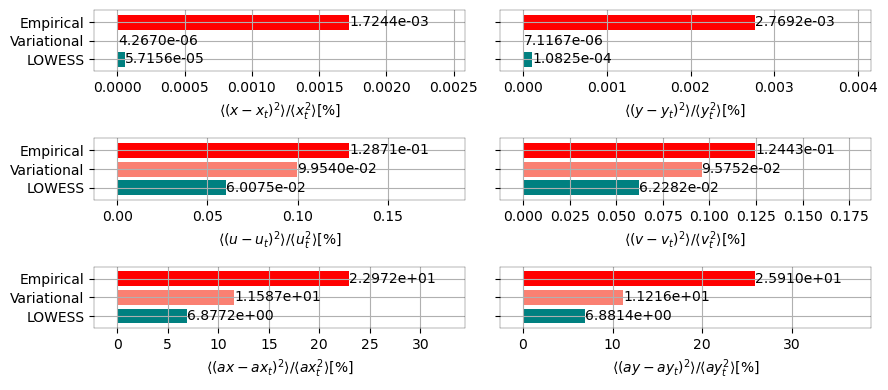

In [16]:
fig, axs = plt.subplots(3, 2, sharey=True, figsize=(9, 4))
i = 0
axs = axs.flatten()
for var in [
    "x",
    "y",
    "u",
    "v",
    "ax",
    "ay",
]:
    ax = axs[i]
    dfr[var].plot.barh(ax=ax, color=["teal", "salmon", "r"], width=0.8)
    ax.grid()
    ax.set_xlim(-0.1 * dfr[var].max(), dfr[var].max() * 1.5)
    i += 1
    ax.set_xlabel(
        rf"$\langle ({var}-{var}_t)^2 \rangle / \langle {var}_t^2 \rangle [\%]$"
    )
    ax.bar_label(
        ax.containers[0],
        labels=[
            np.format_float_scientific(l, precision=4, exp_digits=2)
            for l in dfr[var].values
        ],
    )
fig.tight_layout()
# fig.suptitle('refcase =' +str(ref_case) + '\n spydell ' +str(parameters_spydell)+'\n variational '+str(parameters_var)+'\n lowess '+str(parameters_lowess),
#            x= 0.5, y=-0.02, fontsize=8)
path = os.path.join(images_dir, "comp_method_ref_case.png")
fig.savefig(path, dpi=250)

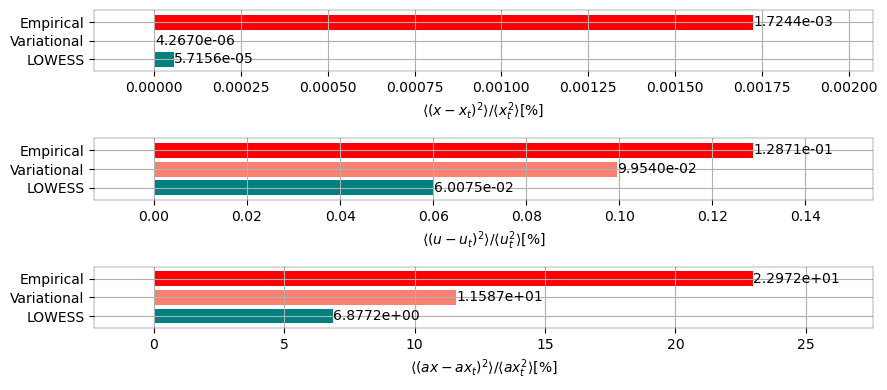

In [17]:
fig, axs = plt.subplots(3, 1, sharey=True, figsize=(9, 4))
i = 0
axs = axs.flatten()
for var in [
    "x",
    "u",
    "ax",
]:
    ax = axs[i]
    dfr[var].plot.barh(ax=ax, color=["teal", "salmon", "r"], width=0.8)
    ax.grid()
    ax.set_xlim(-0.1 * dfr[var].max(), dfr[var].max() * 1.2)
    i += 1
    ax.set_xlabel(
        rf"$\langle ({var}-{var}_t)^2 \rangle / \langle {var}_t^2 \rangle [\%]$"
    )
    ax.bar_label(
        ax.containers[0],
        labels=[
            np.format_float_scientific(l, precision=4, exp_digits=2)
            for l in dfr[var].values
        ],
    )
fig.tight_layout()
# fig.suptitle('refcase =' +str(ref_case) + '\n spydell ' +str(parameters_spydell)+'\n variational '+str(parameters_var)+'\n lowess '+str(parameters_lowess),
#            x= 0.5, y=-0.02, fontsize=8)
path = os.path.join(images_dir, "comp_method_ref_case.png")
fig.savefig(path, dpi=250)